In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [34 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/tmp/pip-install-xwof0p1y/pyyaml_3c1713de33b14ddc907e505ec90ad162/setup.py", line 291, in <module>
          setup(
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 185, in setup
          return run_commands(dist)
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 201, in run_commands
          dist.run_commands()
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/dist.py", line 969, in run_commands
          self.run_command(cmd)
        File "/opt/conda/lib/pyth

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [4]:
!kaggle datasets download -d tannergi/chess-piece-detection

Dataset URL: https://www.kaggle.com/datasets/tannergi/chess-piece-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 87%|██████████████████████████████████▋     | 144M/166M [00:01<00:00, 79.7MB/s]
100%|████████████████████████████████████████| 166M/166M [00:01<00:00, 90.2MB/s]


In [5]:
!unzip chess-piece-detection.zip

Archive:  chess-piece-detection.zip
  inflating: Chess Detection/annotations/IMG_1989.xml  
  inflating: Chess Detection/annotations/IMG_1990.xml  
  inflating: Chess Detection/annotations/IMG_1991.xml  
  inflating: Chess Detection/annotations/IMG_1992.xml  
  inflating: Chess Detection/annotations/IMG_1993.xml  
  inflating: Chess Detection/annotations/IMG_1994.xml  
  inflating: Chess Detection/annotations/IMG_1995.xml  
  inflating: Chess Detection/annotations/IMG_1996.xml  
  inflating: Chess Detection/annotations/IMG_1997.xml  
  inflating: Chess Detection/annotations/IMG_1998.xml  
  inflating: Chess Detection/annotations/IMG_1999.xml  
  inflating: Chess Detection/annotations/IMG_2000.xml  
  inflating: Chess Detection/annotations/IMG_2001.xml  
  inflating: Chess Detection/annotations/IMG_2002.xml  
  inflating: Chess Detection/annotations/IMG_2003.xml  
  inflating: Chess Detection/annotations/IMG_2004.xml  
  inflating: Chess Detection/annotations/IMG_2005.xml  
  inflating:

In [6]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2
import xml.etree.ElementTree as ET


# write a function that loads the dataset into detectron2's standard format
def get_dataset_dicts(annotation_path, image_path):
    classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(annotation_path)):
        record = {}
        root = ET.parse(os.path.join(annotation_path, filename)).getroot()
        record["file_name"] = os.path.join(image_path, root.find('filename').text)
        record["height"] = 2248
        record["width"] = 4000

        objs = []
        for member in root.findall('object'):
          obj = {
              'bbox': [int(member[4][0].text), int(member[4][1].text), int(member[4][2].text), int(member[4][3].text)],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': classes.index(member[0].text),
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [7]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

DatasetCatalog.register('chess_piece_dataset', lambda: get_dataset_dicts('Chess Detection/annotations', 'Chess Detection/images'))
MetadataCatalog.get('chess_piece_dataset').set(thing_classes=classes)
chess_metadata = MetadataCatalog.get('chess_piece_dataset')

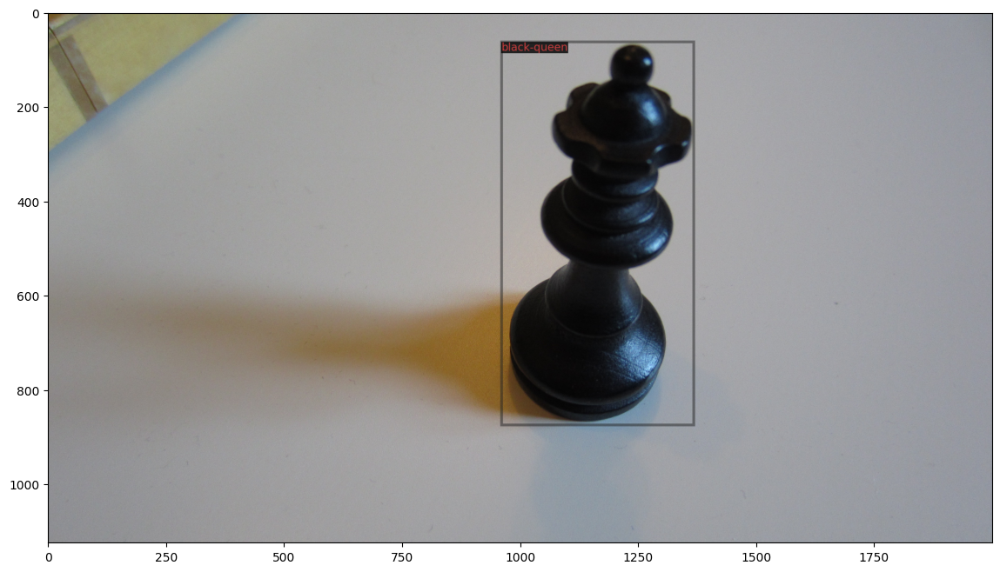

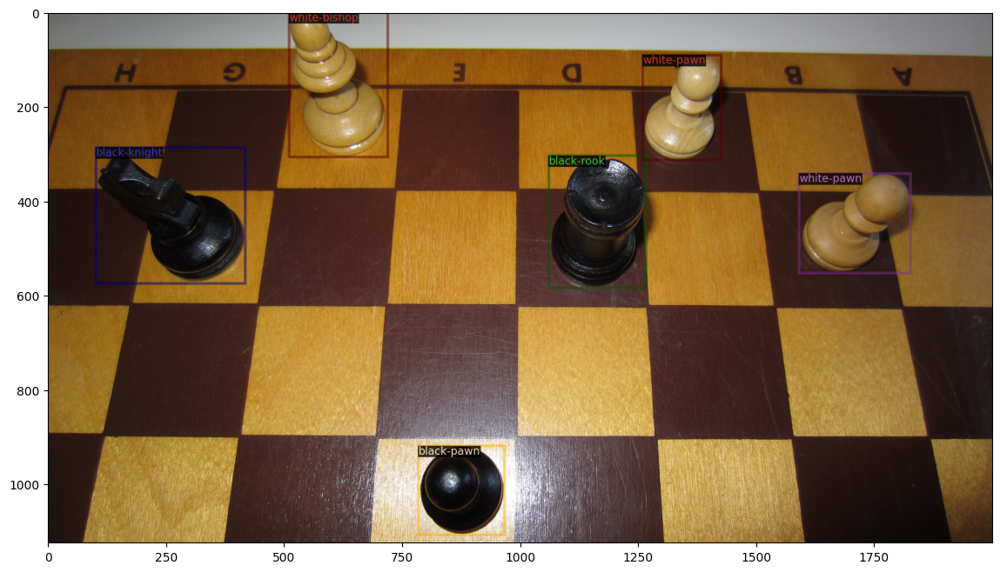

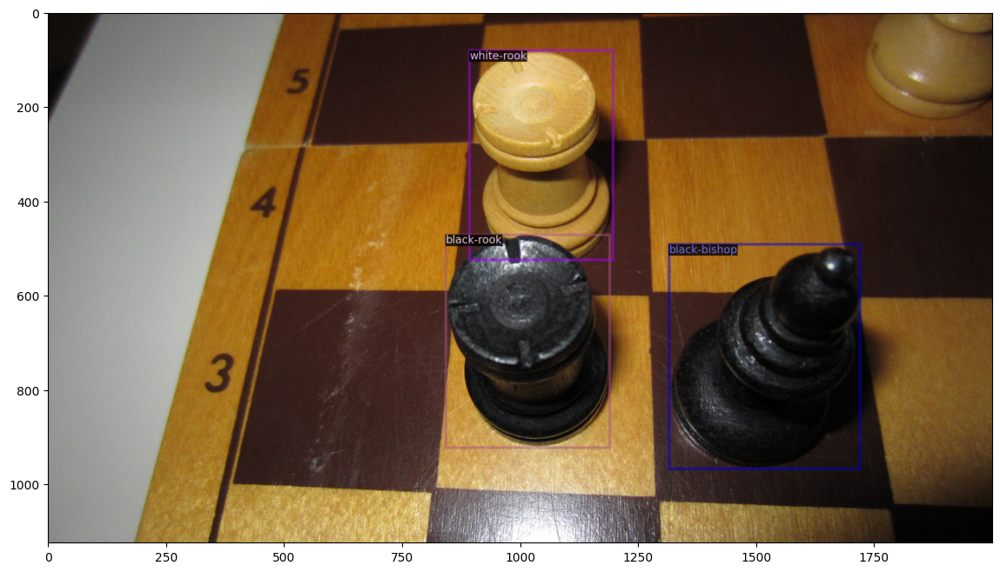

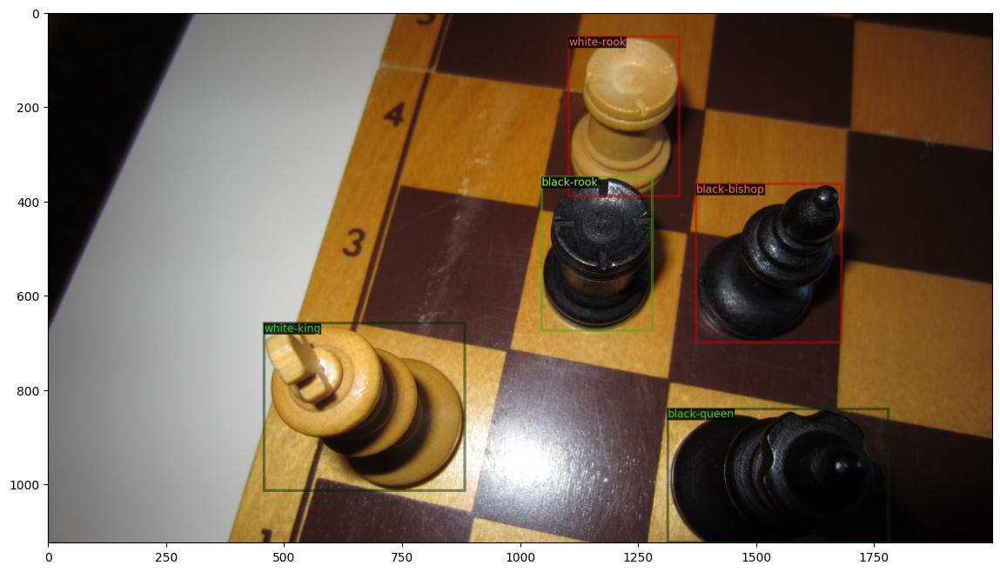

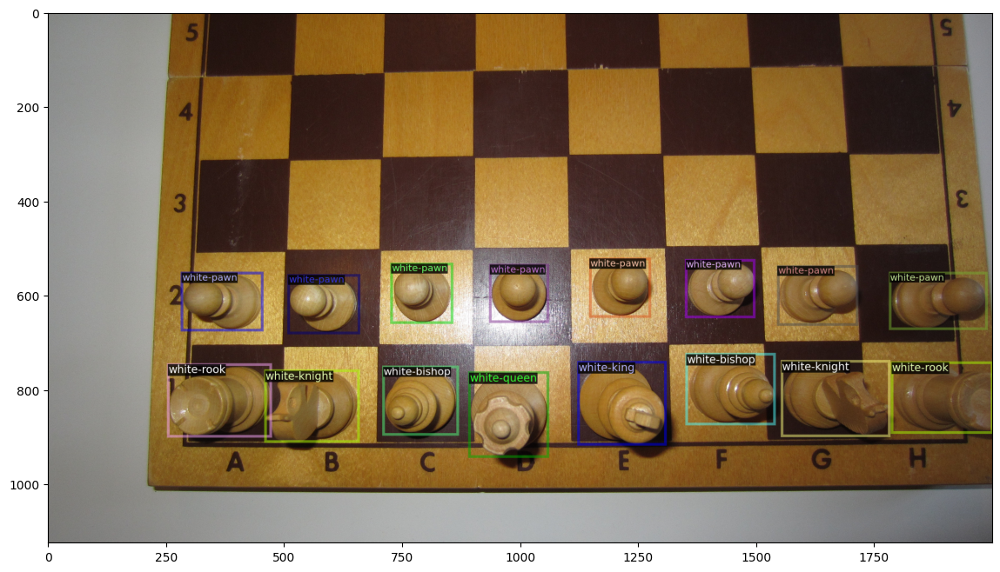

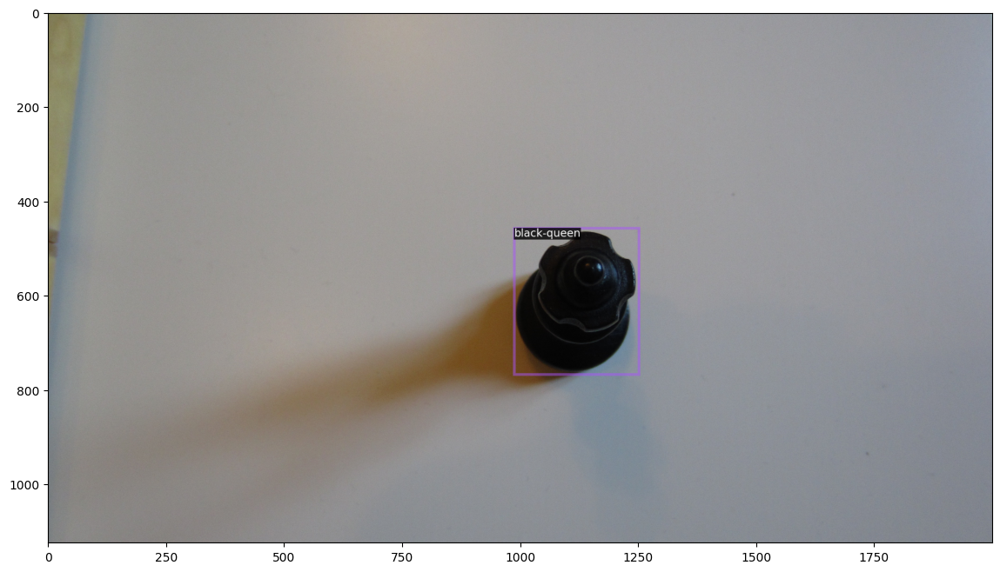

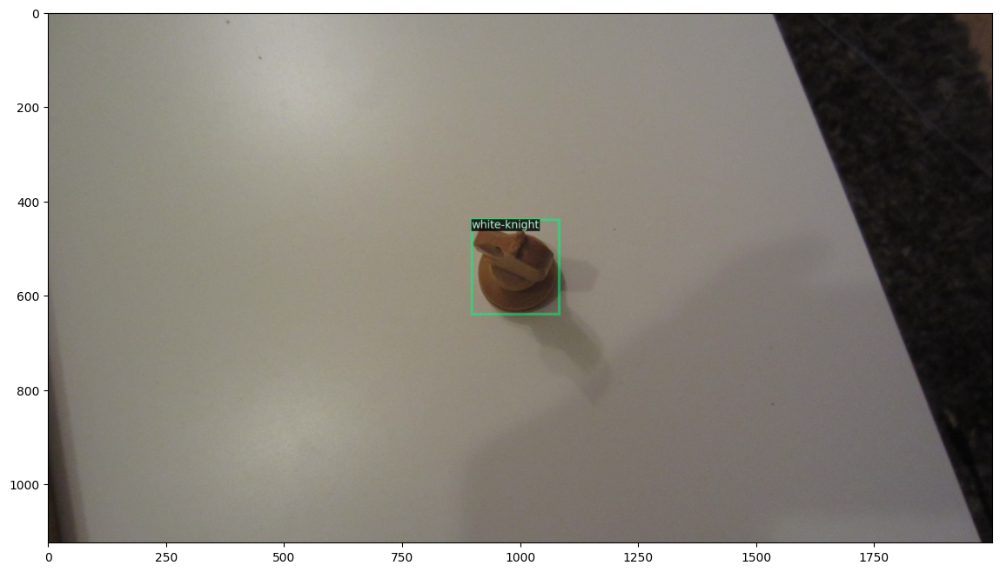

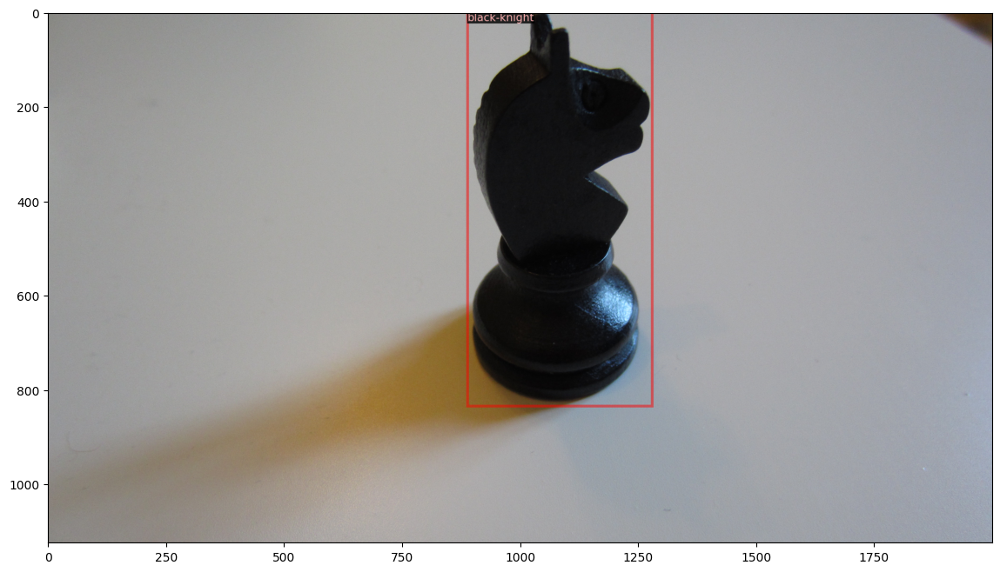

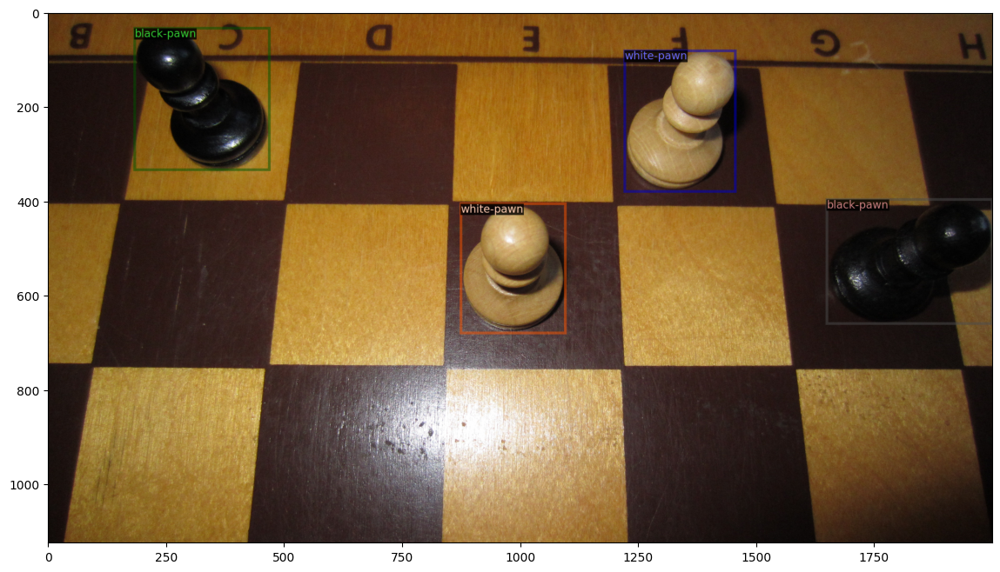

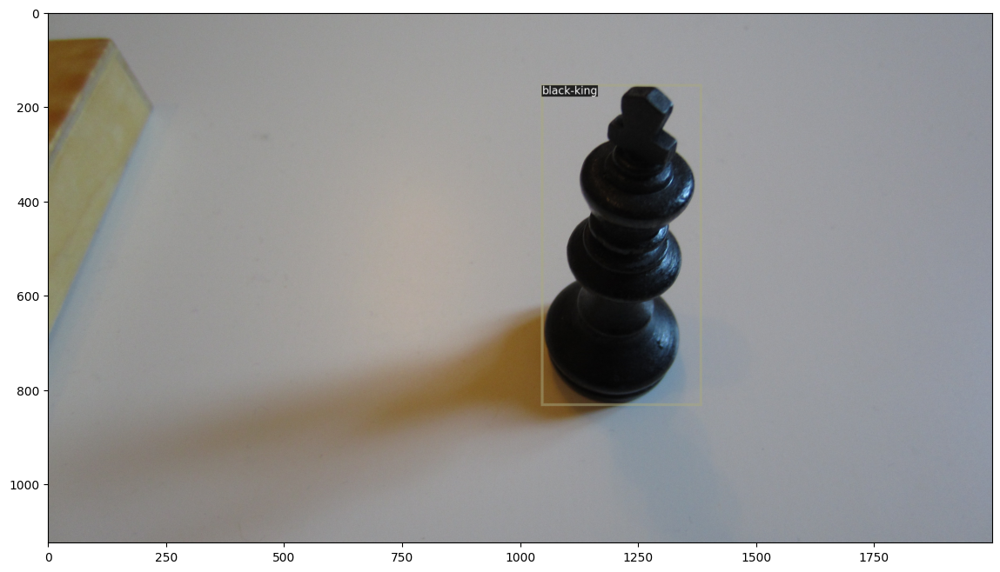

In [8]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('chess_piece_dataset')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=chess_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
import os
import logging
import time
from detectron2.engine import DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2 import model_zoo
from tabulate import tabulate
from detectron2.data import DatasetCatalog, MetadataCatalog

# Configure logging
log_file = 'training_log.txt'
logging.basicConfig(filename=log_file, level=logging.INFO)

# Print message to console to confirm logging setup
print(f"Logging to {log_file}")

# List of learning rates to experiment with
learning_rates = [0.001, 0.005, 0.01]

# Number of iterations and runs
num_iterations = 1000
num_runs = 10

# Data structure to store results
results = []

# Custom hook to log the training progress
class LossLoggerHook(HookBase):
    def __init__(self):
        super().__init__()

    def after_step(self):
        if self.trainer.storage.iter % 20 == 0:  # Log every 20 iterations
            total_loss = self.trainer.storage.history("total_loss").latest()
            logging.info(f"iter: {self.trainer.storage.iter} total_loss: {total_loss}")
            print(f"Logged iteration {self.trainer.storage.iter}")

# Function to train with a specific learning rate
def train_with_learning_rate(lr):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/rpn_R_50_C4_1x.yaml"))
    cfg.DATASETS.TRAIN = ('chess_piece_dataset',)
    cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/rpn_R_50_C4_1x.yaml")
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.MAX_ITER = num_iterations
    cfg.SOLVER.STEPS = []  # do not decay learning rate
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12
    cfg.SOLVER.BASE_LR = lr  # Set learning rate

    # Implement gradient clipping correctly
    cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "norm"
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.register_hooks([LossLoggerHook()])

    start_time = time.time()
    trainer.resume_or_load(resume=False)
    trainer.train()
    end_time = time.time()

    # Get the minimum loss over all iterations
    min_loss = min(trainer.storage.history("total_loss").values())

    return min_loss, end_time - start_time

# Run training for each learning rate
for lr in learning_rates:
    lr_results = []
    for run in range(num_runs):
        logging.info(f"Starting training with learning rate: {lr}, run: {run + 1}")
        print(f"Starting training with learning rate: {lr}, run: {run + 1}")
        min_loss, duration = train_with_learning_rate(lr)
        lr_results.append([lr, run + 1, min_loss, duration])
    results.extend(lr_results)

# Aggregate results for each learning rate
summary_results = []
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    min_loss = min(lr_runs, key=lambda x: x[2])[2]
    total_time = sum(run[3] for run in lr_runs)
    summary_results.append([lr, min_loss, total_time])

# Tabulate the detailed results for each run
headers = ["Learning Rate", "Run", "Minimum Loss", "Duration (s)"]
print(tabulate(results, headers, floatfmt=".6f"))

# Log the detailed results to the file
logging.info(tabulate(results, headers, floatfmt=".6f"))

# Tabulate and print the summary results
summary_headers = ["Learning Rate", "Minimum Loss", "Total Time (s)"]
print(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Log the summary results to the file
logging.info(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Tabulate the detailed results for each learning rate
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    print(f"\nDetailed results for learning rate: {lr}")
    print(tabulate(lr_runs, headers, floatfmt=".6f"))
    logging.info(f"\nDetailed results for learning rate: {lr}")
    logging.info(tabulate(lr_runs, headers, floatfmt=".6f"))


Logging to training_log.txt
Starting training with learning rate: 0.001, run: 1
[06/04 10:22:13 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1

model_final_450694.pkl: 72.4MB [00:00, 117MB/s]                             

[06/04 10:22:13 d2.engine.train_loop]: Starting training from iteration 0



/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Logged iteration 0
[06/04 10:22:23 d2.utils.events]:  eta: 0:05:48  iter: 19  total_loss: 0.1278  loss_rpn_cls: 0.08182  loss_rpn_loc: 0.03825    time: 0.3355  last_time: 0.3758  data_time: 0.1655  last_data_time: 0.1943   lr: 1.9981e-05  max_mem: 1290M


2024-06-04 10:22:26.059916: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-04 10:22:26.060026: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-04 10:22:26.191098: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Logged iteration 20
[06/04 10:22:42 d2.utils.events]:  eta: 0:05:29  iter: 39  total_loss: 0.07617  loss_rpn_cls: 0.05754  loss_rpn_loc: 0.01958    time: 0.3403  last_time: 0.3727  data_time: 0.1647  last_data_time: 0.1948   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:22:49 d2.utils.events]:  eta: 0:05:23  iter: 59  total_loss: 0.1418  loss_rpn_cls: 0.07469  loss_rpn_loc: 0.03866    time: 0.3406  last_time: 0.3640  data_time: 0.1683  last_data_time: 0.1851   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:22:56 d2.utils.events]:  eta: 0:05:17  iter: 79  total_loss: 0.0671  loss_rpn_cls: 0.04166  loss_rpn_loc: 0.01981    time: 0.3413  last_time: 0.3035  data_time: 0.1743  last_data_time: 0.1471   lr: 7.9921e-05  max_mem: 1290M
Logged iteration 80
[06/04 10:23:02 d2.utils.events]:  eta: 0:05:11  iter: 99  total_loss: 0.05692  loss_rpn_cls: 0.03407  loss_rpn_loc: 0.0218    time: 0.3399  last_time: 0.3447  data_time: 0.1642  last_data_time: 0.1631   lr: 9.9901

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 10:28:26 d2.utils.events]:  eta: 0:06:30  iter: 19  total_loss: 0.1151  loss_rpn_cls: 0.08716  loss_rpn_loc: 0.02543    time: 0.4026  last_time: 0.4752  data_time: 0.2386  last_data_time: 0.2890   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 10:28:33 d2.utils.events]:  eta: 0:06:09  iter: 39  total_loss: 0.09726  loss_rpn_cls: 0.05722  loss_rpn_loc: 0.02725    time: 0.3925  last_time: 0.3685  data_time: 0.2065  last_data_time: 0.1840   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:28:41 d2.utils.events]:  eta: 0:06:05  iter: 59  total_loss: 0.08859  loss_rpn_cls: 0.06508  loss_rpn_loc: 0.02476    time: 0.3897  last_time: 0.3642  data_time: 0.2070  last_data_time: 0.1832   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:28:48 d2.utils.events]:  eta: 0:05:54  iter: 79  total_loss: 0.06731  loss_rpn_cls: 0.04181  loss_rpn_loc: 0.02319    time: 0.3856  last_time: 0.4103  data_time: 0.1961  last_data_time: 0.2265   lr: 7.992

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 3
[06/04 10:34:50 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 10:34:58 d2.utils.events]:  eta: 0:06:28  iter: 19  total_loss: 0.1083  loss_rpn_cls: 0.08599  loss_rpn_loc: 0.02997    time: 0.3932  last_time: 0.3968  data_time: 0.2322  last_data_time: 0.2171   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 10:35:06 d2.utils.events]:  eta: 0:06:20  iter: 39  total_loss: 0.09539  loss_rpn_cls: 0.06684  loss_rpn_loc: 0.02696    time: 0.3944  last_time: 0.3908  data_time: 0.2191  last_data_time: 0.2080   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:35:14 d2.utils.events]:  eta: 0:06:11  iter: 59  total_loss: 0.09234  loss_rpn_cls: 0.06315  loss_rpn_loc: 0.02835    time: 0.3895  last_time: 0.3953  data_time: 0.1998  last_data_time: 0.2121   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:35:22 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 0.06913  loss_rpn_cls: 0.04398  loss_rpn_loc: 0.02414    time: 0.3931  last_time: 0.3644  data_time: 0.2262  last_data_time: 0.1894   lr: 7.992

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 4
[06/04 10:41:20 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 10:41:29 d2.utils.events]:  eta: 0:06:17  iter: 19  total_loss: 0.1132  loss_rpn_cls: 0.08633  loss_rpn_loc: 0.02898    time: 0.3862  last_time: 0.3534  data_time: 0.2248  last_data_time: 0.1707   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 10:41:36 d2.utils.events]:  eta: 0:06:11  iter: 39  total_loss: 0.1119  loss_rpn_cls: 0.08036  loss_rpn_loc: 0.03191    time: 0.3873  last_time: 0.3978  data_time: 0.2097  last_data_time: 0.2138   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:41:44 d2.utils.events]:  eta: 0:06:05  iter: 59  total_loss: 0.08847  loss_rpn_cls: 0.05671  loss_rpn_loc: 0.02448    time: 0.3933  last_time: 0.3557  data_time: 0.2304  last_data_time: 0.1739   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:41:52 d2.utils.events]:  eta: 0:05:56  iter: 79  total_loss: 0.07937  loss_rpn_cls: 0.04817  loss_rpn_loc: 0.02445    time: 0.3887  last_time: 0.3923  data_time: 0.1988  last_data_time: 0.2077   lr: 7.9921

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 5
[06/04 10:47:53 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 10:48:02 d2.utils.events]:  eta: 0:06:26  iter: 19  total_loss: 0.09675  loss_rpn_cls: 0.0751  loss_rpn_loc: 0.02385    time: 0.4054  last_time: 0.3866  data_time: 0.2460  last_data_time: 0.2072   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 10:48:10 d2.utils.events]:  eta: 0:06:21  iter: 39  total_loss: 0.1127  loss_rpn_cls: 0.06704  loss_rpn_loc: 0.03437    time: 0.4007  last_time: 0.4100  data_time: 0.2170  last_data_time: 0.2268   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:48:18 d2.utils.events]:  eta: 0:06:14  iter: 59  total_loss: 0.08442  loss_rpn_cls: 0.0557  loss_rpn_loc: 0.02414    time: 0.3989  last_time: 0.3518  data_time: 0.2175  last_data_time: 0.1743   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:48:25 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 0.0785  loss_rpn_cls: 0.0563  loss_rpn_loc: 0.02415    time: 0.3927  last_time: 0.4078  data_time: 0.2000  last_data_time: 0.2268   lr: 7.9921e-0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 6
[06/04 10:54:27 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 10:54:36 d2.utils.events]:  eta: 0:06:31  iter: 19  total_loss: 0.1051  loss_rpn_cls: 0.07459  loss_rpn_loc: 0.02504    time: 0.3900  last_time: 0.3532  data_time: 0.2346  last_data_time: 0.1924   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 10:54:43 d2.utils.events]:  eta: 0:06:16  iter: 39  total_loss: 0.1128  loss_rpn_cls: 0.08049  loss_rpn_loc: 0.0313    time: 0.3881  last_time: 0.3981  data_time: 0.2151  last_data_time: 0.2200   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 10:54:51 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.09945  loss_rpn_cls: 0.06784  loss_rpn_loc: 0.02585    time: 0.3950  last_time: 0.3867  data_time: 0.2354  last_data_time: 0.2035   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 10:54:59 d2.utils.events]:  eta: 0:05:56  iter: 79  total_loss: 0.09192  loss_rpn_cls: 0.05158  loss_rpn_loc: 0.03235    time: 0.3904  last_time: 0.3844  data_time: 0.2002  last_data_time: 0.2034   lr: 7.9921e

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 7
[06/04 11:00:58 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:01:07 d2.utils.events]:  eta: 0:06:26  iter: 19  total_loss: 0.09816  loss_rpn_cls: 0.07533  loss_rpn_loc: 0.02623    time: 0.4092  last_time: 0.3940  data_time: 0.2495  last_data_time: 0.2130   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:01:14 d2.utils.events]:  eta: 0:06:08  iter: 39  total_loss: 0.09257  loss_rpn_cls: 0.05312  loss_rpn_loc: 0.03021    time: 0.3890  last_time: 0.3911  data_time: 0.1949  last_data_time: 0.2117   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 11:01:22 d2.utils.events]:  eta: 0:05:57  iter: 59  total_loss: 0.08641  loss_rpn_cls: 0.06153  loss_rpn_loc: 0.02818    time: 0.3848  last_time: 0.3998  data_time: 0.1966  last_data_time: 0.2150   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 11:01:29 d2.utils.events]:  eta: 0:05:48  iter: 79  total_loss: 0.08124  loss_rpn_cls: 0.05522  loss_rpn_loc: 0.02541    time: 0.3822  last_time: 0.3687  data_time: 0.1984  last_data_time: 0.1842   lr: 7.99

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 8
[06/04 11:07:29 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:07:37 d2.utils.events]:  eta: 0:06:24  iter: 19  total_loss: 0.1186  loss_rpn_cls: 0.07868  loss_rpn_loc: 0.02704    time: 0.3941  last_time: 0.4084  data_time: 0.2339  last_data_time: 0.2244   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:07:45 d2.utils.events]:  eta: 0:06:16  iter: 39  total_loss: 0.09855  loss_rpn_cls: 0.06103  loss_rpn_loc: 0.02978    time: 0.3907  last_time: 0.3893  data_time: 0.2087  last_data_time: 0.2077   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 11:07:53 d2.utils.events]:  eta: 0:06:05  iter: 59  total_loss: 0.09087  loss_rpn_cls: 0.06317  loss_rpn_loc: 0.02453    time: 0.3855  last_time: 0.3708  data_time: 0.1994  last_data_time: 0.2069   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 11:08:00 d2.utils.events]:  eta: 0:05:57  iter: 79  total_loss: 0.07893  loss_rpn_cls: 0.04924  loss_rpn_loc: 0.02619    time: 0.3881  last_time: 0.4031  data_time: 0.2194  last_data_time: 0.2164   lr: 7.992

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 9
[06/04 11:14:03 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:14:11 d2.utils.events]:  eta: 0:06:22  iter: 19  total_loss: 0.1096  loss_rpn_cls: 0.08259  loss_rpn_loc: 0.02815    time: 0.3947  last_time: 0.3675  data_time: 0.2313  last_data_time: 0.2104   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:14:19 d2.utils.events]:  eta: 0:06:18  iter: 39  total_loss: 0.08622  loss_rpn_cls: 0.06538  loss_rpn_loc: 0.02138    time: 0.4009  last_time: 0.3456  data_time: 0.2317  last_data_time: 0.1663   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 11:14:27 d2.utils.events]:  eta: 0:06:07  iter: 59  total_loss: 0.1022  loss_rpn_cls: 0.06538  loss_rpn_loc: 0.03487    time: 0.3958  last_time: 0.3781  data_time: 0.2118  last_data_time: 0.2139   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 11:14:34 d2.utils.events]:  eta: 0:05:58  iter: 79  total_loss: 0.06091  loss_rpn_cls: 0.0411  loss_rpn_loc: 0.02088    time: 0.3906  last_time: 0.3670  data_time: 0.1996  last_data_time: 0.1838   lr: 7.9921e

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 10
[06/04 11:20:34 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (no

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:20:42 d2.utils.events]:  eta: 0:06:28  iter: 19  total_loss: 0.1176  loss_rpn_cls: 0.0894  loss_rpn_loc: 0.02538    time: 0.3979  last_time: 0.3833  data_time: 0.2396  last_data_time: 0.2191   lr: 1.9981e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:20:50 d2.utils.events]:  eta: 0:06:12  iter: 39  total_loss: 0.09275  loss_rpn_cls: 0.0572  loss_rpn_loc: 0.02486    time: 0.3896  last_time: 0.3727  data_time: 0.2032  last_data_time: 0.2152   lr: 3.9961e-05  max_mem: 1290M
Logged iteration 40
[06/04 11:20:58 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.1036  loss_rpn_cls: 0.0666  loss_rpn_loc: 0.03232    time: 0.3902  last_time: 0.3941  data_time: 0.2140  last_data_time: 0.2088   lr: 5.9941e-05  max_mem: 1290M
Logged iteration 60
[06/04 11:21:06 d2.utils.events]:  eta: 0:06:03  iter: 79  total_loss: 0.07408  loss_rpn_cls: 0.05326  loss_rpn_loc: 0.02129    time: 0.3946  last_time: 0.4431  data_time: 0.2305  last_data_time: 0.2718   lr: 7.9921e-0

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 1
[06/04 11:27:06 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:27:15 d2.utils.events]:  eta: 0:06:22  iter: 19  total_loss: 0.1238  loss_rpn_cls: 0.08948  loss_rpn_loc: 0.03344    time: 0.3924  last_time: 0.3205  data_time: 0.2399  last_data_time: 0.1629   lr: 9.9905e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:27:22 d2.utils.events]:  eta: 0:06:03  iter: 39  total_loss: 0.0737  loss_rpn_cls: 0.04854  loss_rpn_loc: 0.022    time: 0.3802  last_time: 0.3647  data_time: 0.1917  last_data_time: 0.1852   lr: 0.0001998  max_mem: 1290M
Logged iteration 40
[06/04 11:27:30 d2.utils.events]:  eta: 0:05:58  iter: 59  total_loss: 0.05008  loss_rpn_cls: 0.02787  loss_rpn_loc: 0.02297    time: 0.3867  last_time: 0.3704  data_time: 0.2224  last_data_time: 0.2124   lr: 0.0002997  max_mem: 1290M
Logged iteration 60
[06/04 11:27:38 d2.utils.events]:  eta: 0:05:54  iter: 79  total_loss: 0.04121  loss_rpn_cls: 0.01844  loss_rpn_loc: 0.02194    time: 0.3865  last_time: 0.3923  data_time: 0.2055  last_data_time: 0.2319   lr: 0.00039961

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 2
[06/04 11:33:38 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:33:46 d2.utils.events]:  eta: 0:06:29  iter: 19  total_loss: 0.09876  loss_rpn_cls: 0.071  loss_rpn_loc: 0.0278    time: 0.4140  last_time: 0.5169  data_time: 0.2463  last_data_time: 0.3515   lr: 9.9905e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:33:54 d2.utils.events]:  eta: 0:06:20  iter: 39  total_loss: 0.09107  loss_rpn_cls: 0.05228  loss_rpn_loc: 0.02957    time: 0.4000  last_time: 0.3877  data_time: 0.2127  last_data_time: 0.2097   lr: 0.0001998  max_mem: 1290M
Logged iteration 40
[06/04 11:34:02 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.05967  loss_rpn_cls: 0.02983  loss_rpn_loc: 0.02742    time: 0.3909  last_time: 0.3931  data_time: 0.1953  last_data_time: 0.2098   lr: 0.0002997  max_mem: 1290M
Logged iteration 60
[06/04 11:34:10 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 0.04837  loss_rpn_cls: 0.02236  loss_rpn_loc: 0.02309    time: 0.3924  last_time: 0.3320  data_time: 0.2180  last_data_time: 0.1594   lr: 0.0003996

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 3
[06/04 11:40:10 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:40:19 d2.utils.events]:  eta: 0:06:34  iter: 19  total_loss: 0.09537  loss_rpn_cls: 0.07095  loss_rpn_loc: 0.02965    time: 0.3968  last_time: 0.4068  data_time: 0.2369  last_data_time: 0.2258   lr: 9.9905e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:40:27 d2.utils.events]:  eta: 0:06:14  iter: 39  total_loss: 0.08203  loss_rpn_cls: 0.0526  loss_rpn_loc: 0.02301    time: 0.3890  last_time: 0.4180  data_time: 0.2075  last_data_time: 0.2348   lr: 0.0001998  max_mem: 1290M
Logged iteration 40
[06/04 11:40:34 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.06783  loss_rpn_cls: 0.02703  loss_rpn_loc: 0.03943    time: 0.3902  last_time: 0.3363  data_time: 0.2122  last_data_time: 0.1634   lr: 0.0002997  max_mem: 1290M
Logged iteration 60
[06/04 11:40:42 d2.utils.events]:  eta: 0:05:59  iter: 79  total_loss: 0.03349  loss_rpn_cls: 0.0147  loss_rpn_loc: 0.01724    time: 0.3916  last_time: 0.3930  data_time: 0.2145  last_data_time: 0.2326   lr: 0.000399

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 4
[06/04 11:46:45 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:46:53 d2.utils.events]:  eta: 0:06:30  iter: 19  total_loss: 0.1104  loss_rpn_cls: 0.07733  loss_rpn_loc: 0.02897    time: 0.3868  last_time: 0.3915  data_time: 0.2319  last_data_time: 0.2212   lr: 9.9905e-05  max_mem: 1290M
Logged iteration 20
[06/04 11:47:01 d2.utils.events]:  eta: 0:06:21  iter: 39  total_loss: 0.08214  loss_rpn_cls: 0.05668  loss_rpn_loc: 0.02453    time: 0.3947  last_time: 0.3693  data_time: 0.2295  last_data_time: 0.1878   lr: 0.0001998  max_mem: 1290M
Logged iteration 40
[06/04 11:47:09 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.05353  loss_rpn_cls: 0.02861  loss_rpn_loc: 0.02565    time: 0.3928  last_time: 0.3577  data_time: 0.2113  last_data_time: 0.1734   lr: 0.0002997  max_mem: 1290M
Logged iteration 60
[06/04 11:47:16 d2.utils.events]:  eta: 0:05:59  iter: 79  total_loss: 0.03827  loss_rpn_cls: 0.01429  loss_rpn_loc: 0.01921    time: 0.3898  last_time: 0.4249  data_time: 0.2074  last_data_time: 0.2484   lr: 0.00039

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 5
[06/04 11:53:19 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 11:53:27 d2.utils.events]:  eta: 0:06:31  iter: 19  total_loss: 0.09884  loss_rpn_cls: 0.07188  loss_rpn_loc: 0.02973    time: 0.3969  last_time: 0.3851  data_time: 0.2384  last_data_time: 0.2017   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 11:53:35 d2.utils.events]:  eta: 0:06:13  iter: 39  total_loss: 0.07168  loss_rpn_cls: 0.05077  loss_rpn_loc: 0.02263    time: 0.3907  last_time: 0.3530  data_time: 0.2091  last_data_time: 0.1748   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 11:53:43 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.04521  loss_rpn_cls: 0.02611  loss_rpn_loc: 0.02002    time: 0.3888  last_time: 0.3926  data_time: 0.2110  last_data_time: 0.2269   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 11:53:51 d2.utils.events]:  eta: 0:05:56  iter: 79  total_loss: 0.04029  loss_rpn_cls: 0.01375  loss_rpn_loc: 0.02567    time: 0.3897  last_time: 0.3635  data_time: 0.2144  last_data_time: 0.1769   lr: 0.0003

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 6
[06/04 11:59:53 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:00:01 d2.utils.events]:  eta: 0:06:18  iter: 19  total_loss: 0.1115  loss_rpn_cls: 0.07768  loss_rpn_loc: 0.02714    time: 0.3807  last_time: 0.3569  data_time: 0.2200  last_data_time: 0.2125   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 12:00:09 d2.utils.events]:  eta: 0:06:17  iter: 39  total_loss: 0.0771  loss_rpn_cls: 0.05374  loss_rpn_loc: 0.02469    time: 0.3924  last_time: 0.4498  data_time: 0.2253  last_data_time: 0.2606   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 12:00:16 d2.utils.events]:  eta: 0:06:07  iter: 59  total_loss: 0.05616  loss_rpn_cls: 0.025  loss_rpn_loc: 0.02617    time: 0.3880  last_time: 0.3748  data_time: 0.2005  last_data_time: 0.1902   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 12:00:24 d2.utils.events]:  eta: 0:05:59  iter: 79  total_loss: 0.05604  loss_rpn_cls: 0.0228  loss_rpn_loc: 0.02984    time: 0.3867  last_time: 0.3855  data_time: 0.2052  last_data_time: 0.2001   lr: 0.00039961 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 7
[06/04 12:06:23 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:06:32 d2.utils.events]:  eta: 0:06:23  iter: 19  total_loss: 0.09977  loss_rpn_cls: 0.07035  loss_rpn_loc: 0.028    time: 0.3986  last_time: 0.3904  data_time: 0.2369  last_data_time: 0.2087   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 12:06:39 d2.utils.events]:  eta: 0:06:15  iter: 39  total_loss: 0.099  loss_rpn_cls: 0.05701  loss_rpn_loc: 0.03179    time: 0.3904  last_time: 0.3521  data_time: 0.2071  last_data_time: 0.2106   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 12:06:47 d2.utils.events]:  eta: 0:06:06  iter: 59  total_loss: 0.05311  loss_rpn_cls: 0.02997  loss_rpn_loc: 0.02735    time: 0.3883  last_time: 0.3202  data_time: 0.2084  last_data_time: 0.1675   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 12:06:55 d2.utils.events]:  eta: 0:05:57  iter: 79  total_loss: 0.04404  loss_rpn_cls: 0.01539  loss_rpn_loc: 0.0254    time: 0.3864  last_time: 0.3459  data_time: 0.2014  last_data_time: 0.1677   lr: 0.00039961 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 8
[06/04 12:12:53 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:13:01 d2.utils.events]:  eta: 0:06:09  iter: 19  total_loss: 0.09935  loss_rpn_cls: 0.07171  loss_rpn_loc: 0.02802    time: 0.3747  last_time: 0.3892  data_time: 0.2194  last_data_time: 0.2115   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 12:13:09 d2.utils.events]:  eta: 0:05:59  iter: 39  total_loss: 0.1003  loss_rpn_cls: 0.06441  loss_rpn_loc: 0.03001    time: 0.3747  last_time: 0.3863  data_time: 0.1991  last_data_time: 0.2067   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 12:13:16 d2.utils.events]:  eta: 0:05:52  iter: 59  total_loss: 0.06125  loss_rpn_cls: 0.02805  loss_rpn_loc: 0.02411    time: 0.3748  last_time: 0.3822  data_time: 0.2073  last_data_time: 0.2097   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 12:13:24 d2.utils.events]:  eta: 0:05:45  iter: 79  total_loss: 0.04258  loss_rpn_cls: 0.01644  loss_rpn_loc: 0.02504    time: 0.3792  last_time: 0.3677  data_time: 0.2178  last_data_time: 0.2018   lr: 0.00039

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 9
[06/04 12:19:24 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:19:32 d2.utils.events]:  eta: 0:06:25  iter: 19  total_loss: 0.08389  loss_rpn_cls: 0.06249  loss_rpn_loc: 0.02363    time: 0.3853  last_time: 0.3536  data_time: 0.2273  last_data_time: 0.1706   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 12:19:41 d2.utils.events]:  eta: 0:06:13  iter: 39  total_loss: 0.09237  loss_rpn_cls: 0.05837  loss_rpn_loc: 0.03193    time: 0.3980  last_time: 0.3983  data_time: 0.2282  last_data_time: 0.2158   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 12:19:49 d2.utils.events]:  eta: 0:06:08  iter: 59  total_loss: 0.06133  loss_rpn_cls: 0.03107  loss_rpn_loc: 0.03021    time: 0.3977  last_time: 0.3783  data_time: 0.2198  last_data_time: 0.2211   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 12:19:56 d2.utils.events]:  eta: 0:06:00  iter: 79  total_loss: 0.04153  loss_rpn_cls: 0.01841  loss_rpn_loc: 0.02246    time: 0.3933  last_time: 0.3679  data_time: 0.2045  last_data_time: 0.2080   lr: 0.0003

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 10
[06/04 12:25:59 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (no

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:26:08 d2.utils.events]:  eta: 0:06:13  iter: 19  total_loss: 0.1248  loss_rpn_cls: 0.07614  loss_rpn_loc: 0.03006    time: 0.3838  last_time: 0.3575  data_time: 0.2228  last_data_time: 0.1753   lr: 9.9905e-05  max_mem: 1291M
Logged iteration 20
[06/04 12:26:15 d2.utils.events]:  eta: 0:06:17  iter: 39  total_loss: 0.08235  loss_rpn_cls: 0.05443  loss_rpn_loc: 0.0279    time: 0.3874  last_time: 0.3690  data_time: 0.2125  last_data_time: 0.1849   lr: 0.0001998  max_mem: 1291M
Logged iteration 40
[06/04 12:26:23 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.07286  loss_rpn_cls: 0.04261  loss_rpn_loc: 0.02924    time: 0.3857  last_time: 0.4213  data_time: 0.2027  last_data_time: 0.2341   lr: 0.0002997  max_mem: 1291M
Logged iteration 60
[06/04 12:26:31 d2.utils.events]:  eta: 0:06:03  iter: 79  total_loss: 0.03731  loss_rpn_cls: 0.01287  loss_rpn_loc: 0.01988    time: 0.3908  last_time: 0.4168  data_time: 0.2303  last_data_time: 0.2455   lr: 0.000399

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 1
[06/04 12:32:33 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:32:41 d2.utils.events]:  eta: 0:06:23  iter: 19  total_loss: 0.1044  loss_rpn_cls: 0.07446  loss_rpn_loc: 0.03434    time: 0.3888  last_time: 0.4197  data_time: 0.2346  last_data_time: 0.2494   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 12:32:49 d2.utils.events]:  eta: 0:06:21  iter: 39  total_loss: 0.05991  loss_rpn_cls: 0.03322  loss_rpn_loc: 0.02393    time: 0.3981  last_time: 0.4696  data_time: 0.2263  last_data_time: 0.2868   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 12:32:57 d2.utils.events]:  eta: 0:06:09  iter: 59  total_loss: 0.04643  loss_rpn_cls: 0.01978  loss_rpn_loc: 0.02571    time: 0.3938  last_time: 0.3704  data_time: 0.2131  last_data_time: 0.1876   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 12:33:05 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 0.02771  loss_rpn_cls: 0.008013  loss_rpn_loc: 0.02021    time: 0.3926  last_time: 0.3570  data_time: 0.2126  last_data_time: 0.1780   lr: 0.00

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 2
[06/04 12:39:08 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:39:17 d2.utils.events]:  eta: 0:06:30  iter: 19  total_loss: 0.122  loss_rpn_cls: 0.07691  loss_rpn_loc: 0.03434    time: 0.3952  last_time: 0.3630  data_time: 0.2421  last_data_time: 0.1823   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 12:39:24 d2.utils.events]:  eta: 0:06:14  iter: 39  total_loss: 0.04885  loss_rpn_cls: 0.03245  loss_rpn_loc: 0.0203    time: 0.3903  last_time: 0.3960  data_time: 0.2080  last_data_time: 0.2085   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 12:39:32 d2.utils.events]:  eta: 0:06:07  iter: 59  total_loss: 0.0483  loss_rpn_cls: 0.02326  loss_rpn_loc: 0.02296    time: 0.3890  last_time: 0.3994  data_time: 0.2098  last_data_time: 0.2145   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 12:39:40 d2.utils.events]:  eta: 0:05:59  iter: 79  total_loss: 0.03313  loss_rpn_cls: 0.01067  loss_rpn_loc: 0.02029    time: 0.3899  last_time: 0.5379  data_time: 0.2188  last_data_time: 0.3606   lr: 0.000799

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 3
[06/04 12:45:46 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:45:55 d2.utils.events]:  eta: 0:06:34  iter: 19  total_loss: 0.1181  loss_rpn_cls: 0.07763  loss_rpn_loc: 0.0283    time: 0.3992  last_time: 0.4027  data_time: 0.2385  last_data_time: 0.2202   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 12:46:03 d2.utils.events]:  eta: 0:06:25  iter: 39  total_loss: 0.06533  loss_rpn_cls: 0.03573  loss_rpn_loc: 0.0248    time: 0.4087  last_time: 0.4043  data_time: 0.2410  last_data_time: 0.2231   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 12:46:11 d2.utils.events]:  eta: 0:06:14  iter: 59  total_loss: 0.04997  loss_rpn_cls: 0.01763  loss_rpn_loc: 0.02473    time: 0.4023  last_time: 0.3814  data_time: 0.2120  last_data_time: 0.1992   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 12:46:19 d2.utils.events]:  eta: 0:06:05  iter: 79  total_loss: 0.03757  loss_rpn_cls: 0.01214  loss_rpn_loc: 0.02241    time: 0.3977  last_time: 0.4086  data_time: 0.2042  last_data_time: 0.2216   lr: 0.00079

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 4
[06/04 12:52:24 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:52:33 d2.utils.events]:  eta: 0:06:23  iter: 19  total_loss: 0.1134  loss_rpn_cls: 0.07704  loss_rpn_loc: 0.03244    time: 0.3873  last_time: 0.4241  data_time: 0.2254  last_data_time: 0.2383   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 12:52:40 d2.utils.events]:  eta: 0:06:13  iter: 39  total_loss: 0.06367  loss_rpn_cls: 0.03421  loss_rpn_loc: 0.03045    time: 0.3871  last_time: 0.3897  data_time: 0.2051  last_data_time: 0.2066   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 12:52:48 d2.utils.events]:  eta: 0:06:06  iter: 59  total_loss: 0.04387  loss_rpn_cls: 0.01517  loss_rpn_loc: 0.02583    time: 0.3891  last_time: 0.4113  data_time: 0.2136  last_data_time: 0.2282   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 12:52:56 d2.utils.events]:  eta: 0:06:00  iter: 79  total_loss: 0.03377  loss_rpn_cls: 0.01181  loss_rpn_loc: 0.02105    time: 0.3932  last_time: 0.4080  data_time: 0.2240  last_data_time: 0.2298   lr: 0.000

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 5
[06/04 12:59:00 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 12:59:08 d2.utils.events]:  eta: 0:06:38  iter: 19  total_loss: 0.113  loss_rpn_cls: 0.06988  loss_rpn_loc: 0.03153    time: 0.4066  last_time: 0.4436  data_time: 0.2456  last_data_time: 0.2729   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 12:59:16 d2.utils.events]:  eta: 0:06:28  iter: 39  total_loss: 0.0576  loss_rpn_cls: 0.03565  loss_rpn_loc: 0.02094    time: 0.4085  last_time: 0.4170  data_time: 0.2317  last_data_time: 0.2326   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 12:59:24 d2.utils.events]:  eta: 0:06:10  iter: 59  total_loss: 0.038  loss_rpn_cls: 0.0159  loss_rpn_loc: 0.02229    time: 0.3982  last_time: 0.4305  data_time: 0.2035  last_data_time: 0.2456   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 12:59:32 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 0.03757  loss_rpn_cls: 0.009887  loss_rpn_loc: 0.02472    time: 0.3947  last_time: 0.3549  data_time: 0.2054  last_data_time: 0.1744   lr: 0.0007992

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 6
[06/04 13:05:42 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 13:05:51 d2.utils.events]:  eta: 0:06:31  iter: 19  total_loss: 0.08873  loss_rpn_cls: 0.06631  loss_rpn_loc: 0.02463    time: 0.4003  last_time: 0.4105  data_time: 0.2443  last_data_time: 0.2304   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 13:05:59 d2.utils.events]:  eta: 0:06:20  iter: 39  total_loss: 0.06396  loss_rpn_cls: 0.03821  loss_rpn_loc: 0.022    time: 0.3941  last_time: 0.4060  data_time: 0.2118  last_data_time: 0.2232   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 13:06:07 d2.utils.events]:  eta: 0:06:19  iter: 59  total_loss: 0.03811  loss_rpn_cls: 0.01491  loss_rpn_loc: 0.02182    time: 0.4000  last_time: 0.3416  data_time: 0.2348  last_data_time: 0.1807   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 13:06:14 d2.utils.events]:  eta: 0:06:04  iter: 79  total_loss: 0.04893  loss_rpn_cls: 0.01398  loss_rpn_loc: 0.03362    time: 0.3956  last_time: 0.3786  data_time: 0.2064  last_data_time: 0.2192   lr: 0.0007

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 7
[06/04 13:12:21 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 13:12:29 d2.utils.events]:  eta: 0:06:32  iter: 19  total_loss: 0.1108  loss_rpn_cls: 0.07517  loss_rpn_loc: 0.02643    time: 0.4041  last_time: 0.4034  data_time: 0.2532  last_data_time: 0.2181   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 13:12:37 d2.utils.events]:  eta: 0:06:24  iter: 39  total_loss: 0.06967  loss_rpn_cls: 0.03844  loss_rpn_loc: 0.02984    time: 0.4014  last_time: 0.4034  data_time: 0.2214  last_data_time: 0.2215   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 13:12:45 d2.utils.events]:  eta: 0:06:16  iter: 59  total_loss: 0.03959  loss_rpn_cls: 0.0155  loss_rpn_loc: 0.02247    time: 0.4008  last_time: 0.3952  data_time: 0.2253  last_data_time: 0.2302   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 13:12:53 d2.utils.events]:  eta: 0:06:06  iter: 79  total_loss: 0.03879  loss_rpn_cls: 0.008921  loss_rpn_loc: 0.02895    time: 0.4023  last_time: 0.4307  data_time: 0.2272  last_data_time: 0.2460   lr: 0.000

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 8
[06/04 13:18:57 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 13:19:06 d2.utils.events]:  eta: 0:06:42  iter: 19  total_loss: 0.1093  loss_rpn_cls: 0.078  loss_rpn_loc: 0.03608    time: 0.4087  last_time: 0.3872  data_time: 0.2459  last_data_time: 0.2330   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 13:19:14 d2.utils.events]:  eta: 0:06:26  iter: 39  total_loss: 0.05618  loss_rpn_cls: 0.03033  loss_rpn_loc: 0.02196    time: 0.4040  last_time: 0.4959  data_time: 0.2239  last_data_time: 0.3115   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 13:19:22 d2.utils.events]:  eta: 0:06:13  iter: 59  total_loss: 0.04235  loss_rpn_cls: 0.01247  loss_rpn_loc: 0.02296    time: 0.3985  last_time: 0.3970  data_time: 0.2136  last_data_time: 0.2332   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 13:19:30 d2.utils.events]:  eta: 0:06:04  iter: 79  total_loss: 0.03455  loss_rpn_cls: 0.0103  loss_rpn_loc: 0.0251    time: 0.3974  last_time: 0.4014  data_time: 0.2177  last_data_time: 0.2180   lr: 0.0007992

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 10
[06/04 13:32:08 d2.engine.defaults]: Model:
ProposalNetwork(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (nor

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/04 13:32:16 d2.utils.events]:  eta: 0:06:26  iter: 19  total_loss: 0.1026  loss_rpn_cls: 0.06598  loss_rpn_loc: 0.0274    time: 0.3939  last_time: 0.4176  data_time: 0.2373  last_data_time: 0.2344   lr: 0.00019981  max_mem: 1291M
Logged iteration 20
[06/04 13:32:25 d2.utils.events]:  eta: 0:06:26  iter: 39  total_loss: 0.07607  loss_rpn_cls: 0.04566  loss_rpn_loc: 0.02292    time: 0.4102  last_time: 0.5135  data_time: 0.2477  last_data_time: 0.3262   lr: 0.00039961  max_mem: 1291M
Logged iteration 40
[06/04 13:32:33 d2.utils.events]:  eta: 0:06:17  iter: 59  total_loss: 0.0321  loss_rpn_cls: 0.01557  loss_rpn_loc: 0.01713    time: 0.4075  last_time: 0.4504  data_time: 0.2309  last_data_time: 0.2762   lr: 0.00059941  max_mem: 1291M
Logged iteration 60
[06/04 13:32:41 d2.utils.events]:  eta: 0:06:04  iter: 79  total_loss: 0.04434  loss_rpn_cls: 0.01264  loss_rpn_loc: 0.02502    time: 0.4010  last_time: 0.4113  data_time: 0.1981  last_data_time: 0.2240   lr: 0.00079

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  Learning Rate    Run  Minimum Loss                    Duration (s)
---------------  -----  ----------------------------  --------------
       0.001000      1  (0.001060681555827614, 834)       363.412957
       0.001000      2  (0.0011851423187181354, 584)      392.313505
       0.001000      3  (0.0009324189450126141, 910)      389.518622
       0.001000      4  (0.0009651805448811501, 576)      392.086795
       0.001000      5  (0.0013629020395455882, 962)      393.418287
       0.001000      6  (0.001310646563069895, 867)       390.470260
       0.001000      7  (0.0006106213259045035, 851)      389.813069
       0.001000      8  (0.0009655148824094795, 907)      392.981949
       0.001000      9  (0.0009129229292739183, 886)      390.355263
       0.001000     10  (0.0009638053888920695, 941)      391.864143
       0.005000      1  (0.0009753657650435343, 820)      390.684660
       0.005000      2  (0.0008999718629638664, 809)      392.130623
       0.005000      3  (0.0008323

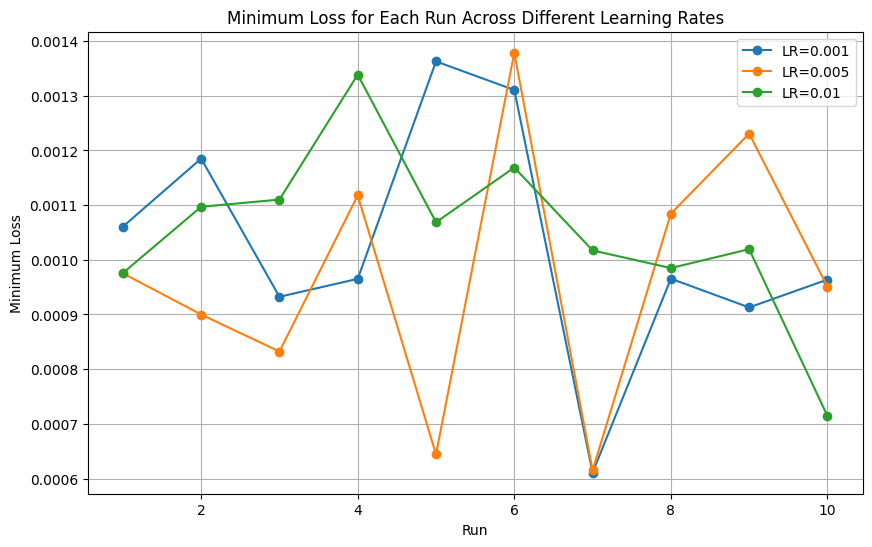

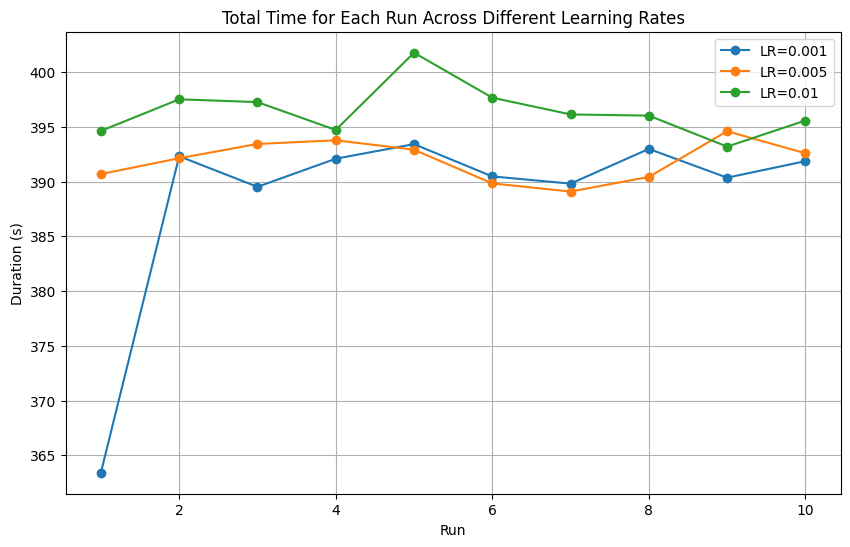

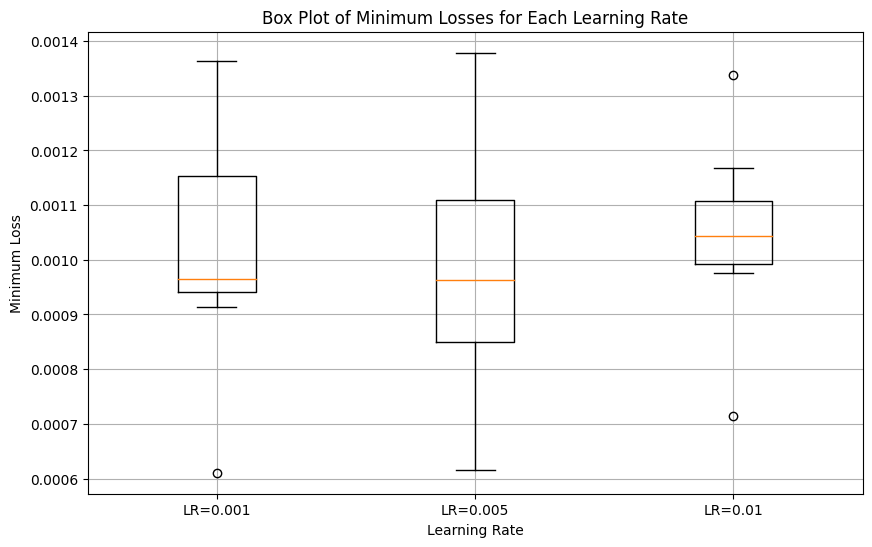

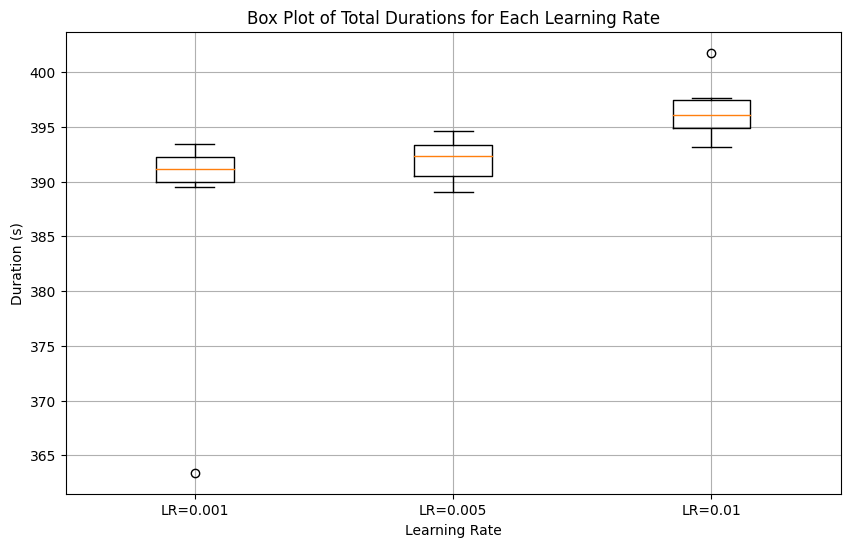

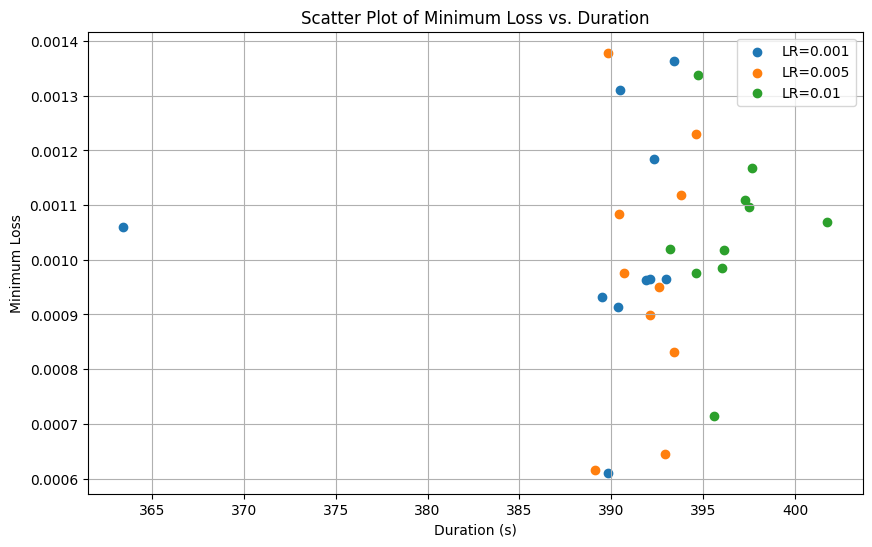

In [10]:
import matplotlib.pyplot as plt

# Assuming `results` is a list of lists with the structure [learning_rate, run, (min_loss, iteration), duration]

# Extract data for plotting
learning_rates = sorted(set(result[0] for result in results))
num_runs = len([result for result in results if result[0] == learning_rates[0]])

# Prepare data for plotting
loss_data = {lr: [] for lr in learning_rates}
time_data = {lr: [] for lr in learning_rates}

for result in results:
    lr, run, (min_loss, _), duration = result
    loss_data[lr].append(min_loss)
    time_data[lr].append(duration)

# Plot minimum loss for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), loss_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Minimum Loss')
plt.title('Minimum Loss for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Plot total time for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), time_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Duration (s)')
plt.title('Total Time for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Box plot of minimum losses
plt.figure(figsize=(10, 6))
plt.boxplot([loss_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Minimum Loss')
plt.title('Box Plot of Minimum Losses for Each Learning Rate')
plt.grid(True)
plt.show()

# Box plot of total durations
plt.figure(figsize=(10, 6))
plt.boxplot([time_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Duration (s)')
plt.title('Box Plot of Total Durations for Each Learning Rate')
plt.grid(True)
plt.show()

# Scatter plot of minimum loss vs. duration
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.scatter(time_data[lr], loss_data[lr], label=f'LR={lr}')
plt.xlabel('Duration (s)')
plt.ylabel('Minimum Loss')
plt.title('Scatter Plot of Minimum Loss vs. Duration')
plt.legend()
plt.grid(True)
plt.show()
